# <center>${\textbf{Machine Learning}}$</center><br><center>${\textbf{ Supervised Learning :  Regression}}$</center><br><center>${\textbf{Automobile Prices}}$</center>


${\textbf{Importing Libraries}}$

In [1]:
import warnings
warnings.simplefilter("ignore")

In [2]:
import numpy as np
import pandas as pd
import pandas_profiling as pp

In [3]:
%matplotlib inline
import matplotlib as plt
from matplotlib import pyplot
import seaborn as sns

In [4]:
from scipy import stats

In [5]:
import statsmodels.api as sm

In [6]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import SGDRegressor

In [7]:
from sklearn.pipeline import Pipeline

In [8]:
from sklearn.tree import DecisionTreeRegressor

In [9]:
from sklearn.ensemble import RandomForestRegressor

In [10]:
from sklearn.neighbors import KNeighborsRegressor

In [11]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, ConstantKernel

In [12]:
import optuna
from optuna.samplers import TPESampler

In [13]:
import xgboost as xgb
from xgboost import plot_importance

In [14]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

In [15]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [16]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

${\textbf{Loading Automobile Prices Dataset}}$

In [17]:
# create headers list
headers = ["symboling","normalized-losses","make","fuel-type","aspiration", "num-of-doors","body-style",
         "drive-wheels","engine-location","wheel-base", "length","width","height","curb-weight","engine-type",
         "num-of-cylinders", "engine-size","fuel-system","bore","stroke","compression-ratio","horsepower",
         "peak-rpm","city-mpg","highway-mpg","price"]

In [18]:
Auto =  pd.read_csv('imports-85.data', sep=",", header=None)
Auto.columns=headers

<center>${\textbf{Data OverView}}$<center> 


* Data Set Characteristics: Multivariate
* Number of Instances: 205
* Area: N/A
* Attribute Characteristics: Categorical, Integer, Real
* Number of Attributes: 26
* Date Donated: 1987-05-19
* Associated Tasks: Regression
* Missing Values: Yes
* Number of Web Hits: 792886

${\textbf{Sources: }}$ Jeffrey C. Schlimmer (Jeffrey.Schlimmer '@' a.gp.cs.cmu.edu)<br>
${\textbf{From: }}$
1) 1985 Model Import Car and Truck Specifications, 1985 Ward's Automotive Yearbook.
2) Personal Auto Manuals, Insurance Services Office, 160 Water Street, New York, NY 10038
3) Insurance Collision Report, Insurance Institute for Highway Safety, Watergate 600, Washington, DC 20037

${\textbf{Data Set Information: }}$
This data set consists of three types of entities: (a) the specification of an auto in terms of various characteristics, (b) its assigned insurance risk rating, (c) its normalized losses in use as compared to other cars. The second rating corresponds to the degree to which the auto is more risky than its price indicates. Cars are initially assigned a risk factor symbol associated with its price. Then, if it is more risky (or less), this symbol is adjusted by moving it up (or down) the scale. Actuarians call this process "symboling". A value of +3 indicates that the auto is risky, -3 that it is probably pretty safe.<br>
The third factor is the relative average loss payment per insured vehicle year. This value is normalized for all autos within a particular size classification (two-door small, station wagons, sports/speciality, etc...), and represents the average loss per car per year.<br>

${\textbf{Note: }}$: Several of the attributes in the database could be used as a "class" attribute.

${\textbf{Attribute Information: }}$
1. symboling: -3, -2, -1, 0, 1, 2, 3.
2. normalized-losses: continuous from 65 to 256.
3. make:
alfa-romero, audi, bmw, chevrolet, dodge, honda,
isuzu, jaguar, mazda, mercedes-benz, mercury,
mitsubishi, nissan, peugot, plymouth, porsche,
renault, saab, subaru, toyota, volkswagen, volvo

4. fuel-type: diesel, gas.
5. aspiration: std, turbo.
6. num-of-doors: four, two.
7. body-style: hardtop, wagon, sedan, hatchback, convertible.
8. drive-wheels: 4wd, fwd, rwd.
9. engine-location: front, rear.
10. wheel-base: continuous from 86.6 120.9.
11. length: continuous from 141.1 to 208.1.
12. width: continuous from 60.3 to 72.3.
13. height: continuous from 47.8 to 59.8.
14. curb-weight: continuous from 1488 to 4066.
15. engine-type: dohc, dohcv, l, ohc, ohcf, ohcv, rotor.
16. num-of-cylinders: eight, five, four, six, three, twelve, two.
17. engine-size: continuous from 61 to 326.
18. fuel-system: 1bbl, 2bbl, 4bbl, idi, mfi, mpfi, spdi, spfi.
19. bore: continuous from 2.54 to 3.94.
20. stroke: continuous from 2.07 to 4.17.
21. compression-ratio: continuous from 7 to 23.
22. horsepower: continuous from 48 to 288.
23. peak-rpm: continuous from 4150 to 6600.
24. city-mpg: continuous from 13 to 49.
25. highway-mpg: continuous from 16 to 54.
26. price: continuous from 5118 to 45400.

${\textbf{Relevant Papers: }}$Kibler, D., Aha, D.W., & Albert,M. (1989). Instance-based prediction of real-valued attributes. Computational Intelligence, Vol 5, 51--57.


${\textbf{Preliminary Insights}}$

In [19]:
print(Auto.shape)
Auto.info()

(205, 26)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    int64  
 1   normalized-losses  205 non-null    object 
 2   make               205 non-null    object 
 3   fuel-type          205 non-null    object 
 4   aspiration         205 non-null    object 
 5   num-of-doors       205 non-null    object 
 6   body-style         205 non-null    object 
 7   drive-wheels       205 non-null    object 
 8   engine-location    205 non-null    object 
 9   wheel-base         205 non-null    float64
 10  length             205 non-null    float64
 11  width              205 non-null    float64
 12  height             205 non-null    float64
 13  curb-weight        205 non-null    int64  
 14  engine-type        205 non-null    object 
 15  num-of-cylinders   205 non-null    object 
 16  engine-size     

In [20]:
Auto.head()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450


In [21]:
Auto.tail()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
200,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845
201,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045
202,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
203,-1,95,volvo,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.40,23.0,106,4800,26,27,22470
204,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,19,25,22625


<center>${\textbf{Data Preprocessing}}$<center>

${\textbf{Missing Data}}$

In the car dataset, missing data comes with the question mark "?". We replace "?" with NaN (Not a Number), which is Python's default missing value marker, for reasons of computational speed and convenience.

In [22]:
Auto.replace("?", np.nan, inplace = True)

In [23]:
Auto.isnull().sum() / len(Auto) * 100 #Percentage of NaN data

symboling             0.00000
normalized-losses    20.00000
make                  0.00000
fuel-type             0.00000
aspiration            0.00000
num-of-doors          0.97561
body-style            0.00000
drive-wheels          0.00000
engine-location       0.00000
wheel-base            0.00000
length                0.00000
width                 0.00000
height                0.00000
curb-weight           0.00000
engine-type           0.00000
num-of-cylinders      0.00000
engine-size           0.00000
fuel-system           0.00000
bore                  1.95122
stroke                1.95122
compression-ratio     0.00000
horsepower            0.97561
peak-rpm              0.97561
city-mpg              0.00000
highway-mpg           0.00000
price                 1.95122
dtype: float64

Based on the summary above, each column has 205 rows of data, seven columns containing missing data:
* normalized-losses: 20% missing data
* num-of-doors: 1% missing data
* bore: 2% missing data
* stroke: 2% missing data
* horsepower: 1% missing data
* peak-rpm: 1% missing data
* price: 2% missing data

${\textbf{How to deal with missing data?}}$
>${\textbf{Droping data}}$
* drop the whole row
* drop the whole column

>${\textbf{Replacing data}}$
* replace it by mean
* replace it by frequency
* replace it based on other functions
Whole columns should be dropped only if most entries in the column are empty. In our dataset, none of the columns are empty enough to drop entirely. We have some freedom in choosing which method to replace data; however, some methods may seem more reasonable than others. We will apply each method to many different columns:


${\textbf{Replace by mean:}}$
* normalized-losses: 41 missing data
* stroke: 4 missing data
* bore: 4 missing data
* horsepower: 2 missing data
* peak-rpm: 2 missing data

${\textbf{Replace by frequency:}}$
* num-of-doors: 2 missing data, replace them with "four".
    * Reason: 84% sedans is four doors. Since four doors is most frequent, it is most likely to occur

${\textbf{Drop the whole row:}}$
* price: 4 missing data, simply delete the whole row
    * Reason: price is what we want to predict. Any data entry without price data cannot be used for prediction; therefore any row now without price data is not useful to us

In [24]:
avg_norm_loss = Auto["normalized-losses"].astype("float").mean(axis=0)
print("Average of normalized-losses:", avg_norm_loss)

Average of normalized-losses: 122.0


In [25]:
Auto["normalized-losses"].replace(np.nan, avg_norm_loss, inplace=True)

In [26]:
avg_bore=Auto['bore'].astype('float').mean(axis=0)
print("Average of bore:", avg_bore)

Average of bore: 3.3297512437810957


In [27]:
Auto["bore"].replace(np.nan, avg_bore, inplace=True)

In [28]:
avg_horsepower = Auto['horsepower'].astype('float').mean(axis=0)
print("Average horsepower:", avg_horsepower)

Average horsepower: 104.25615763546799


In [29]:
Auto['horsepower'].replace(np.nan, avg_horsepower, inplace=True)

In [30]:
avg_peakrpm=Auto['peak-rpm'].astype('float').mean(axis=0)
print("Average peak rpm:", avg_peakrpm)

Average peak rpm: 5125.369458128079


In [31]:
avg_stroke=Auto['stroke'].astype('float').mean(axis=0)
print("Average stroke:", avg_stroke)

Average stroke: 3.2554228855721337


In [32]:
Auto['stroke'].replace(np.nan, avg_stroke, inplace=True)

In [33]:
Auto['num-of-doors'].value_counts()

four    114
two      89
Name: num-of-doors, dtype: int64

We can see that four doors are the most common type. We can also use the ".idxmax()" method to calculate for us the most common type automatically:

In [34]:
Auto['num-of-doors'].value_counts().idxmax()

'four'

In [35]:
Auto["num-of-doors"].replace(np.nan, "four", inplace=True)

Finally, let's drop all rows that do not have price data:

In [36]:
# simply drop whole row with NaN in "price" column
Auto.dropna(subset=["price"], axis=0, inplace=True)
# reset index, because we droped two rows
Auto.reset_index(drop=True, inplace=True)

In [37]:
Auto.isnull().sum() / len(Auto) * 100 #Percentage of NaN data

symboling            0.000000
normalized-losses    0.000000
make                 0.000000
fuel-type            0.000000
aspiration           0.000000
num-of-doors         0.000000
body-style           0.000000
drive-wheels         0.000000
engine-location      0.000000
wheel-base           0.000000
length               0.000000
width                0.000000
height               0.000000
curb-weight          0.000000
engine-type          0.000000
num-of-cylinders     0.000000
engine-size          0.000000
fuel-system          0.000000
bore                 0.000000
stroke               0.000000
compression-ratio    0.000000
horsepower           0.000000
peak-rpm             0.995025
city-mpg             0.000000
highway-mpg          0.000000
price                0.000000
dtype: float64

${\textbf{Data Types}}$

The last step in data cleaning is checking and making sure that all data is in the correct format (int, float, text or other).

In [38]:
Auto.dtypes

symboling              int64
normalized-losses     object
make                  object
fuel-type             object
aspiration            object
num-of-doors          object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                  object
stroke                object
compression-ratio    float64
horsepower            object
peak-rpm              object
city-mpg               int64
highway-mpg            int64
price                 object
dtype: object

In [39]:
Auto[["bore", "stroke"]] = Auto[["bore", "stroke"]].astype("float")
Auto[["normalized-losses"]] = Auto[["normalized-losses"]].astype("int")
Auto[["price"]] = Auto[["price"]].astype("float")
Auto[["peak-rpm"]] = Auto[["peak-rpm"]].astype("float")

${\textbf{Data Standardization}}$

Data is usually collected from different agencies with different formats. (Data Standardization is also a term for a particular type of data normalization, where we subtract the mean and divide by the standard deviation)
>${\textbf{What is Standardization?}}$

Standardization is the process of transforming data into a common format which allows the researcher to make the meaningful comparison.

In [40]:
# Convert mpg to L/100km by mathematical operation (235 divided by mpg)
Auto['city-L/100km'] = 235/Auto["city-mpg"]

>${\textbf{What is Normalization?}}$

Normalization is the process of transforming values of several variables into a similar range. Typical normalizations include scaling the variable so the variable average is 0, scaling the variable so the variance is 1, or scaling variable so the variable values range from 0 to 1

In [41]:
# replace (original value) by (original value)/(maximum value)
Auto['length'] = Auto['length']/Auto['length'].max()
Auto['width'] = Auto['width']/Auto['width'].max()

>${\textbf{What is Binning?}}$

Binning is a process of transforming continuous numerical variables into discrete categorical 'bins', for grouped analysis.<br>
In our dataset, "horsepower" is a real valued variable ranging from 48 to 288, it has 57 unique values. What if we only care about the price difference between cars with high horsepower, medium horsepower, and little horsepower (3 types)? Can we rearrange them into three ‘bins' to simplify analysis?

In [42]:
Auto["horsepower"]=Auto["horsepower"].astype(int, copy=True)

Text(0.5, 1.0, 'horsepower bins')

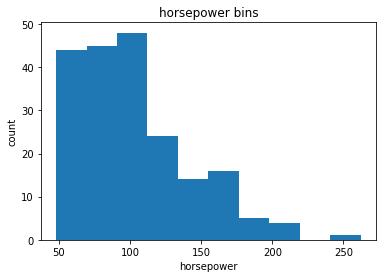

In [43]:
plt.pyplot.hist(Auto["horsepower"])
# set x/y labels and plot title
plt.pyplot.xlabel("horsepower")
plt.pyplot.ylabel("count")
plt.pyplot.title("horsepower bins")

We would like 3 bins of equal size bandwidth with a minimum value to a maximum value, with bandwidth calculated above. The bins will be values used to determine when one bin ends and another begins.

In [44]:
bins = np.linspace(min(Auto["horsepower"]), max(Auto["horsepower"]), 4)
bins

array([ 48.        , 119.33333333, 190.66666667, 262.        ])

In [45]:
group_names = ['Low', 'Medium', 'High']
Auto['horsepower-binned'] = pd.cut(Auto['horsepower'], bins, labels=group_names, include_lowest=True )

In [46]:
Auto["horsepower-binned"].value_counts()

Low       153
Medium     43
High        5
Name: horsepower-binned, dtype: int64

We successfully narrow the intervals from 57 to 3!


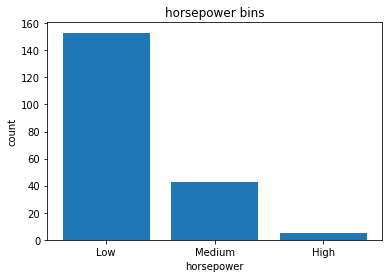

In [47]:
pyplot.bar(group_names, Auto["horsepower-binned"].value_counts())
# set x/y labels and plot title
plt.pyplot.xlabel("horsepower")
plt.pyplot.ylabel("count")
plt.pyplot.title("horsepower bins")
print("We successfully narrow the intervals from 57 to 3!")

>${\textbf{What is Indicator variables?}}$

An indicator variable (or dummy variable) is a numerical variable used to label categories. They are called 'dummies' because the numbers themselves don't have inherent meaning.

In [48]:
dummy_variable_1 = pd.get_dummies(Auto["fuel-type"])
dummy_variable_1.rename(columns={'gas':'fuel-type-gas', 'diesel':'fuel-type-diesel'}, inplace=True)
dummy_variable_1.head()

,fuel-type-diesel,fuel-type-gas
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1


In [49]:
# merge data frame "Auto" and "dummy_variable_1" 
Auto = pd.concat([Auto, dummy_variable_1], axis=1)
# drop original column "fuel-type" from "df"
Auto.drop("fuel-type", axis = 1, inplace=True)

>${\textbf{Exporting Clean Data to CSV}}$

In [50]:
Auto.to_csv('clean_auto.csv')

<center>${\textbf{EDA : Exploratory Data Analysis}}$<center>

In [51]:
pp.ProfileReport(Auto)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Correlation:  
              engine-size     price
engine-size     1.000000  0.872335
price           0.872335  1.000000


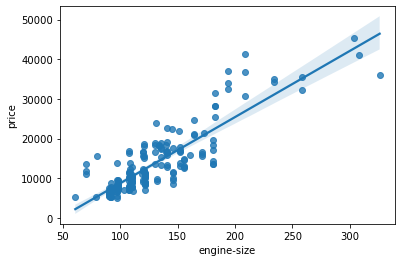

In [52]:
# Engine size as potential predictor variable of price
sns.regplot(x="engine-size", y="price", data=Auto)
print("Correlation:  \n" , Auto[["engine-size", "price"]].corr())

The price rises as the engine size increases, indicating a positive direct association between these two factors. Because the regression line is almost a perfect diagonal line, engine size appears to be a fairly strong predictor of price.

Correlation:  
              highway-mpg     price
highway-mpg     1.000000 -0.704692
price          -0.704692  1.000000


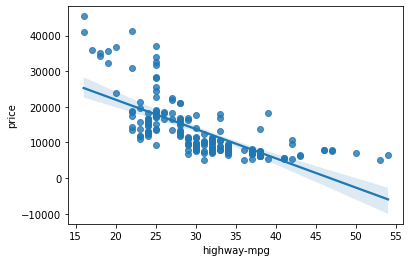

In [53]:
# Engine size as potential predictor variable of price
sns.regplot(x="highway-mpg", y="price", data=Auto)
print("Correlation:  \n" , Auto[["highway-mpg", "price"]].corr())

The price decreases as the highway-mpg increases, indicating an inverse/negative connection between these two factors. Highway mpg has the ability to forecast pricing.

Correlation:  
           peak-rpm     price
peak-rpm  1.000000 -0.101649
price    -0.101649  1.000000


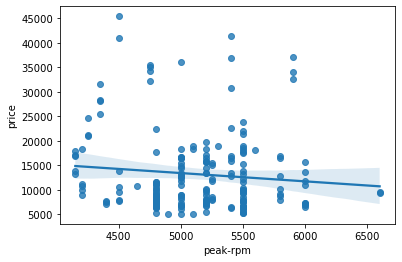

In [54]:
sns.regplot(x="peak-rpm", y="price", data=Auto)
print("Correlation:  \n" , Auto[["peak-rpm", "price"]].corr())

Peak rpm does not appear to be a reliable predictor of price because the regression line is almost horizontal. Furthermore, the data points are dispersed and distant off the fitted line, indicating a high degree of variability. As a result, it is not a dependable variable.

<AxesSubplot:xlabel='body-style', ylabel='price'>

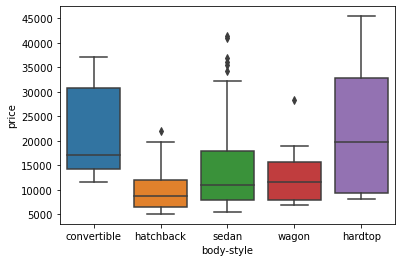

In [55]:
sns.boxplot(x="body-style", y="price", data=Auto)

We can see that the price distributions for the various body-style groups overlap significantly, indicating that body-style is not a strong predictor of price.

<AxesSubplot:xlabel='engine-location', ylabel='price'>

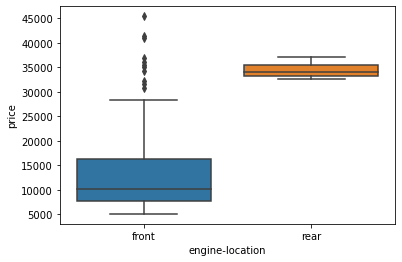

In [56]:
sns.boxplot(x="engine-location", y="price", data=Auto)

We can see here that the price distribution between these two engine-location groups, front and rear, is diverse enough to consider engine-location as a possible good predictor of price.

<AxesSubplot:xlabel='drive-wheels', ylabel='price'>

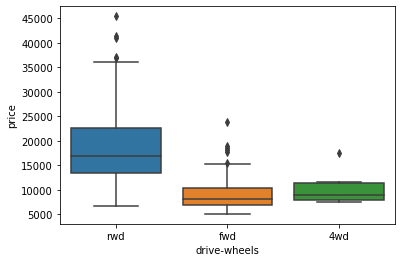

In [57]:
sns.boxplot(x="drive-wheels", y="price", data=Auto)

The price distribution changes between the different drive-wheel classifications, implying that drive-wheels might possibly be a price predictor.

Let's start with a description method to look at the variables.<br>
The describe function computes basic statistics for all continuous variables automatically. In these statistics, any NaN values are automatically skipped.
* the count of that variable
* the mean
* the standard deviation (std)
* the minimum value
* the IQR (Interquartile Range: 25%, 50% and 75%)
* the maximum value

In [58]:
Auto.describe().T

,count,mean,std,min,25%,50%,75%,max
symboling,201.0,0.840796,1.254802,-2.000000,0.000000,1.000000,2.000000,3.000000
normalized-losses,201.0,122.000000,31.996250,65.000000,101.000000,122.000000,137.000000,256.000000
wheel-base,201.0,98.797015,6.066366,86.600000,94.500000,97.000000,102.400000,120.900000
length,201.0,0.837102,0.059213,0.678039,0.801538,0.832292,0.881788,1.000000
width,201.0,0.915126,0.029187,0.837500,0.890278,0.909722,0.925000,1.000000
height,201.0,53.766667,2.447822,47.800000,52.000000,54.100000,55.500000,59.800000
curb-weight,201.0,2555.666667,517.296727,1488.000000,2169.000000,2414.000000,2926.000000,4066.000000
engine-size,201.0,126.875622,41.546834,61.000000,98.000000,120.000000,141.000000,326.000000
bore,201.0,3.330692,0.268072,2.540000,3.150000,3.310000,3.580000,3.940000
stroke,201.0,3.256874,0.316048,2.070000,3.110000,3.290000,3.410000,4.170000


In [59]:
Auto.describe(include=['object']).T

,count,unique,top,freq
make,201,22,toyota,32
aspiration,201,2,std,165
num-of-doors,201,2,four,115
body-style,201,5,sedan,94
drive-wheels,201,3,fwd,118
engine-location,201,2,front,198
engine-type,201,6,ohc,145
num-of-cylinders,201,7,four,157
fuel-system,201,8,mpfi,92


Value-counts are an effective method for determining how many units of each characteristic/variable exist.

In [60]:
drive_wheels_counts =Auto['drive-wheels'].value_counts().to_frame()
drive_wheels_counts.rename(columns={'drive-wheels': 'value_counts'}, inplace=True)
drive_wheels_counts.index.name = 'drive-wheels'
drive_wheels_counts

,value_counts
drive-wheels,
fwd,118
rwd,75
4wd,8


In [61]:
engine_loc_counts = Auto['engine-location'].value_counts().to_frame()
engine_loc_counts.rename(columns={'engine-location': 'value_counts'}, inplace=True)
engine_loc_counts.index.name = 'engine-location'
engine_loc_counts.head(10)

,value_counts
engine-location,
front,198
rear,3


Examining the engine location's value counts would not be a reliable prediction variable for the pricing. Because we only have three automobiles with rear engines and 198 with front engines, this result is biased. As a result, we can't make any judgments regarding the engine's position.

In [62]:
df_group_one = Auto[['drive-wheels','body-style','price']]
df_group_one = df_group_one.groupby(['drive-wheels'],as_index=False).mean()
df_group_one

,drive-wheels,price
0,4wd,10241.000000
1,fwd,9244.779661
2,rwd,19757.613333


According to our research, rear-wheel drive automobiles are the most expensive on average, while 4-wheel and front-wheel drive vehicles are around the same.

In [63]:
df_gptest = Auto[['drive-wheels','body-style','price']]
grouped_test1 = df_gptest.groupby(['drive-wheels','body-style'],as_index=False).mean()
grouped_pivot = grouped_test1.pivot(index='drive-wheels',columns='body-style')
grouped_pivot = grouped_pivot.fillna(0) #fill missing values with 0
grouped_pivot

price                                            \
body-style   convertible       hardtop     hatchback         sedan   
drive-wheels                                                         
4wd                  0.0      0.000000   7603.000000  12647.333333   
fwd              11595.0   8249.000000   8396.387755   9811.800000   
rwd              23949.6  24202.714286  14337.777778  21711.833333   

                            
body-style           wagon  
drive-wheels                
4wd            9095.750000  
fwd            9997.333333  
rwd           16994.222222

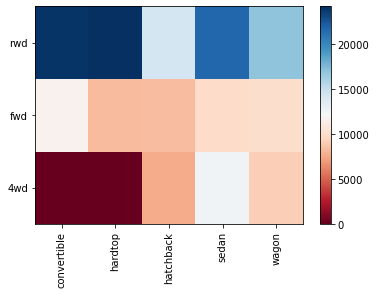

In [64]:
fig, ax = plt.pyplot.subplots()
im = ax.pcolor(grouped_pivot, cmap='RdBu')

#label names
row_labels = grouped_pivot.columns.levels[1]
col_labels = grouped_pivot.index

#move ticks and labels to the center
ax.set_xticks(np.arange(grouped_pivot.shape[1]) + 0.5, minor=False)
ax.set_yticks(np.arange(grouped_pivot.shape[0]) + 0.5, minor=False)

#insert labels
ax.set_xticklabels(row_labels, minor=False)
ax.set_yticklabels(col_labels, minor=False)

#rotate label if too long
plt.pyplot.xticks(rotation=90)

fig.colorbar(im)
plt.pyplot.show()

The heatmap depicts the goal variable (price) as a function of color in relation to the variables 'drive-wheel' and 'body-style' on the vertical and horizontal axes, respectively. This enables us to see how the pricing relates to 'drive-wheel' and 'body-style.'

${\textbf{Correlation}}$: a measure of the extent of interdependence between variables.

${\textbf{Causation}}$: the relationship between cause and effect between two variables.

It is important to know the difference between these two and that correlation does not imply causation. Determining correlation is much simpler the determining causation as causation may require independent experimentation.
The Pearson Correlation measures the linear dependence between two variables X and Y.
The resulting coefficient is a value between -1 and 1 inclusive, where:

* 1: Total positive linear correlation.
* 0: No linear correlation, the two variables most likely do not affect each other.
* -1: Total negative linear correlation.

In [65]:
Auto.corr()


,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,city-L/100km,fuel-type-diesel,fuel-type-gas
symboling,1.000000,0.466264,-0.535987,-0.365404,-0.242423,-0.550160,-0.233118,-0.110581,-0.140019,-0.008153,-0.182196,0.075810,0.280635,-0.035527,0.036233,-0.082391,0.066171,-0.196735,0.196735
normalized-losses,0.466264,1.000000,-0.056661,0.019424,0.086802,-0.373737,0.099404,0.112360,-0.029862,0.055045,-0.114713,0.217300,0.239544,-0.225016,-0.181877,0.133999,0.238567,-0.101546,0.101546
wheel-base,-0.535987,-0.056661,1.000000,0.876024,0.814507,0.590742,0.782097,0.572027,0.493244,0.158018,0.250313,0.371178,-0.360593,-0.470606,-0.543304,0.584642,0.476153,0.307237,-0.307237
length,-0.365404,0.019424,0.876024,1.000000,0.857170,0.492063,0.880665,0.685025,0.608971,0.123952,0.159733,0.579795,-0.286321,-0.665192,-0.698142,0.690628,0.657373,0.211187,-0.211187
width,-0.242423,0.086802,0.814507,0.857170,1.000000,0.306002,0.866201,0.729436,0.544885,0.188822,0.189867,0.615056,-0.245975,-0.633531,-0.680635,0.751265,0.673363,0.244356,-0.244356
height,-0.550160,-0.373737,0.590742,0.492063,0.306002,1.000000,0.307581,0.074694,0.180449,-0.060663,0.259737,-0.087001,-0.311574,-0.049800,-0.104812,0.135486,0.003811,0.281578,-0.281578
curb-weight,-0.233118,0.099404,0.782097,0.880665,0.866201,0.307581,1.000000,0.849072,0.644060,0.167438,0.156433,0.757981,-0.279375,-0.749543,-0.794889,0.834415,0.785353,0.221046,-0.221046
engine-size,-0.110581,0.112360,0.572027,0.685025,0.729436,0.074694,0.849072,1.000000,0.572609,0.205928,0.028889,0.822668,-0.256773,-0.650546,-0.679571,0.872335,0.745059,0.070779,-0.070779
bore,-0.140019,-0.029862,0.493244,0.608971,0.544885,0.180449,0.644060,0.572609,1.000000,-0.055390,0.001263,0.566903,-0.267785,-0.582027,-0.591309,0.543155,0.554610,0.054458,-0.054458
stroke,-0.008153,0.055045,0.158018,0.123952,0.188822,-0.060663,0.167438,0.205928,-0.055390,1.000000,0.187871,0.098128,-0.065272,-0.033956,-0.034636,0.082269,0.036133,0.241064,-0.241064


${\textbf{P-value:}}$
What exactly is the P-value? The P-value indicates the likelihood that the relationship between these two variables is statistically significant. We usually choose a significance threshold of 0.05, which implies we are 95% convinced that the correlation between the variables is significant.It is mainly the probability that an effect could have occurred by chance. If less than the significance level α, or if the test statistic is greater than the critical value, then reject the null.


By convention, when

* the p-value is < 0.001: we say there is strong evidence that the correlation is significant.
* the p-value is < 0.05: there is moderate evidence that the correlation is significant.
* the p-value is < 0.1: there is weak evidence that the correlation is significant.
* the p-value is > 0.1: there is no evidence that the correlation is significant.

In [66]:
pearson_coef, p_value = stats.pearsonr(Auto['wheel-base'], Auto['price'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)  

The Pearson Correlation Coefficient is 0.5846418222655083  with a P-value of P = 8.076488270732873e-20


${\textbf{Conclusion:}}$ The connection between wheel-base and price is statistically significant because the p-value is 0.001, however the linear relationship isn't very strong (0.585).

In [67]:
pearson_coef, p_value = stats.pearsonr(Auto['horsepower'], Auto['price'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)  

The Pearson Correlation Coefficient is 0.8096068016571052  with a P-value of P = 6.273536270650862e-48


${\textbf{Conclusion:}}$ The connection between horsepower and price is statistically significant (p-value = 0.001), and the linear relationship is extremely strong (0.809, close to 1).

In [68]:
pearson_coef, p_value = stats.pearsonr(Auto['length'], Auto['price'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P = ", p_value) 

The Pearson Correlation Coefficient is 0.6906283804483644  with a P-value of P =  8.016477466158188e-30


${\textbf{Conclusion:}}$ The connection between length and price is statistically significant (p-value = 0.001), and the linear relationship is relatively strong (0.691).

In [69]:
pearson_coef, p_value = stats.pearsonr(Auto['width'], Auto['price'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value ) 

The Pearson Correlation Coefficient is 0.7512653440522674  with a P-value of P = 9.200335510481516e-38


${\textbf{Conclusion:}}$ The connection between width and price is statistically significant (p-value = 0.001), and the linear relationship is extremely high (0.751).

In [70]:
pearson_coef, p_value = stats.pearsonr(Auto['curb-weight'], Auto['price'])
print( "The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P = ", p_value) 

The Pearson Correlation Coefficient is 0.8344145257702849  with a P-value of P =  2.1895772388933803e-53


${\textbf{Conclusion:}}$ The connection between curb-weight and price is statistically significant (p-value = 0.001), and the linear relationship is extremely strong (0.834).

In [71]:
pearson_coef, p_value = stats.pearsonr(Auto['engine-size'], Auto['price'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value) 

The Pearson Correlation Coefficient is 0.8723351674455185  with a P-value of P = 9.265491622198389e-64


${\textbf{Conclusion:}}$ Since the p-value is  0.001, the correlation between engine-size and price is statistically significant, and the linear relationship is very strong (~0.872).

In [72]:
pearson_coef, p_value = stats.pearsonr(Auto['bore'], Auto['price'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =  ", p_value ) 

The Pearson Correlation Coefficient is 0.5431553832626606  with a P-value of P =   8.049189483935032e-17


${\textbf{Conclusion:}}$ The association between bore and price is statistically significant (p=0.001), however the linear relationship is relatively mild (0.521).

In [73]:
pearson_coef, p_value = stats.pearsonr(Auto['city-mpg'], Auto['price'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P = ", p_value)  

The Pearson Correlation Coefficient is -0.6865710067844681  with a P-value of P =  2.3211320655673773e-29


${\textbf{Conclusion:}}$ Since the p-value is  0.001, the correlation between city-mpg and price is statistically significant, and the coefficient of ~ -0.687 shows that the relationship is negative and moderately strong.

In [74]:
pearson_coef, p_value = stats.pearsonr(Auto['highway-mpg'], Auto['price'])
print( "The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P = ", p_value )

The Pearson Correlation Coefficient is -0.7046922650589533  with a P-value of P =  1.7495471144474617e-31


${\textbf{Conclusion:}}$ The correlation between highway-mpg and price is statistically significant since the p-value is 0.001, and the coefficient of -0.705 indicates that the association is negative and moderately strong.

${\textbf{Analysis of Variance 'ANOVA':}}$ is a statistical procedure used to determine whether there are significant differences in the means of two or more groups. ANOVA yields two parameters:
${\textbf{F-test score:}}$ANOVA assumes that all groups' means are the same, calculates how much the actual means depart from the assumption, and gives the difference as the F-test score. A higher score indicates a greater gap between the means.

${\textbf{P-value:}}$ The P-value indicates the statistical significance of our estimated score value.

If our pricing variable is highly linked with the variable under consideration, ANOVA should produce a large F-test score and a small p-value.

In [75]:
grouped_test2=df_gptest[['drive-wheels', 'price']].groupby(['drive-wheels'])
grouped_test2.head(2)

,drive-wheels,price
0,rwd,13495.0
1,rwd,16500.0
3,fwd,13950.0
4,4wd,17450.0
5,fwd,15250.0
136,4wd,7603.0


In [76]:
grouped_test2.get_group('4wd')['price']

4      17450.0
136     7603.0
140     9233.0
141    11259.0
144     8013.0
145    11694.0
150     7898.0
151     8778.0
Name: price, dtype: float64

In [77]:
# ANOVA
f_val, p_val = stats.f_oneway(grouped_test2.get_group('fwd')['price'], grouped_test2.get_group('rwd')['price'], grouped_test2.get_group('4wd')['price'])  
print( "ANOVA results: F=", f_val, ", P =", p_val)   

ANOVA results: F= 67.95406500780399 , P = 3.3945443577151245e-23


This is an excellent result, with a big F test score indicating a significant correlation and a P value close to zero signifying statistical significance. Is this to say that all three examined groups are as substantially correlated?

In [78]:
f_val, p_val = stats.f_oneway(grouped_test2.get_group('fwd')['price'], grouped_test2.get_group('rwd')['price'])  
print( "ANOVA results: F=", f_val, ", P =", p_val )

ANOVA results: F= 130.5533160959111 , P = 2.2355306355677845e-23


In [79]:
f_val, p_val = stats.f_oneway(grouped_test2.get_group('4wd')['price'], grouped_test2.get_group('rwd')['price'])  
print( "ANOVA results: F=", f_val, ", P =", p_val)   

ANOVA results: F= 8.580681368924756 , P = 0.004411492211225333


In [80]:
f_val, p_val = stats.f_oneway(grouped_test2.get_group('4wd')['price'], grouped_test2.get_group('fwd')['price'])  
print("ANOVA results: F=", f_val, ", P =", p_val)   

ANOVA results: F= 0.665465750252303 , P = 0.41620116697845666


<center>${\textbf{Conclusion:}}$<center>

We now have a better understanding of how our data looks and which elements are critical to consider when projecting automobile prices. We have reduced it to the following variables:
Variables with continuous numerical values:
* Length
* Width
* Curb-weight
* Engine-size
* Horsepower
* City-mpg
* Highway-mpg
* Wheel-base
* Bore

Variables that are categorical:

* Drive-wheels

As we move forward with developing machine learning models to automate our analysis, giving the model factors that have a meaningful impact on our target variable will increase the model's prediction performance.

<center>${\textbf{Model Development:}}$<center>

${\textbf{Simple Linear Regression:}}$

Straightforward Linear Regression.
Simple Linear Regression is a technique for determining the connection between two variables:

* The independent variable/predictor (X)
* The dependent variable/response (that we want to predict) (Y)

as a result of A linear function that predicts the response (dependent) variable as a function of the predictor (independent) variable is known as linear regression.

$$ 	\hat{Y} = {a + bX} $$

* a denotes the intercept of the regression line, or the value of Y when X is 0.
* b is the slope of the regression line, or the value with which Y changes as X increases by one unit.

In this case, we'll examine at how highway-mpg may assist us anticipate automobile prices. We will develop a linear function with "highway-mpg" as the predictor variable and "price" as the response variable using simple linear regression.

In [81]:
X = Auto[['highway-mpg']]
Y = Auto['price']

In [82]:
lm = LinearRegression()
lm.fit(X,Y)

LinearRegression()

In [83]:
print("Intercept a : ",lm.intercept_)
print("Slope b : ",lm.coef_)

Intercept a :  38423.305858157386
Slope b :  [-821.73337832]


$ Final Model $  $$ \hat{Y} = {8423.31 - 821.73highwaympg} $$


${\textbf{Multiple Linear Regression:}}$

We may use Multiple Linear Regression to forecast automobile prices if we wish to include additional factors in our model. Multiple Linear Regression is similar to Simple Linear Regression in that it explains the relationship between one continuous response (dependent) variable and two or more predictor (independent) variables. The majority of real-world regression models have several factors.

$$ \hat{Y} = {a + b_{1}X_{1} + b_{2}X_{2}+ b_{3}X_{3}+ b_{4}X_{4}} $$

From the previous section we know that other good predictors of price could be:

* Horsepower
* Curb-weight
* Engine-size
* Highway-mpg

Let's develop a model using these variables as the predictor variables.

In [84]:
Z = Auto[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']]

In [85]:
lm.fit(Z, Auto['price'])
print("Intercept a : ",lm.intercept_)
print("Slope b : ",lm.coef_)

Intercept a :  -15811.863767729246
Slope b :  [53.53022809  4.70805253 81.51280006 36.1593925 ]


$ Final Model $  
$$ \hat{Y} = {-15678.74 + 52.66horsepower + 4.70curbweight + 81.99enginesize + 33.60highwaympg} $$


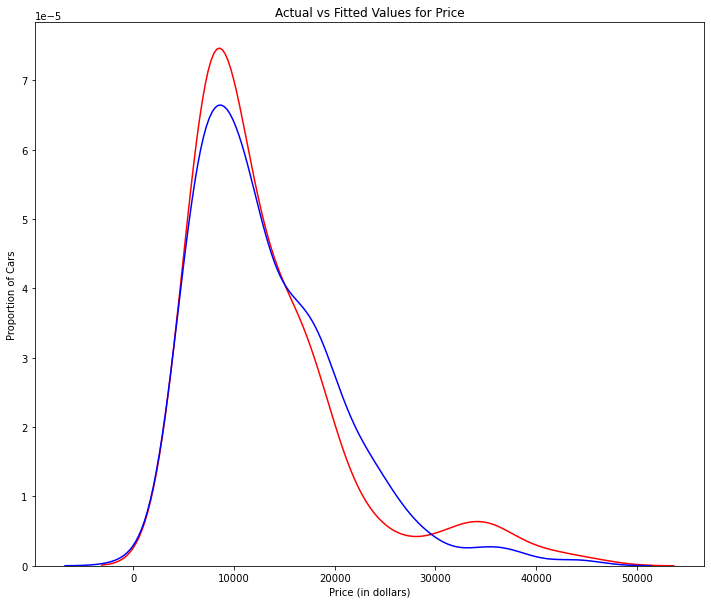

In [86]:
Y_hat = lm.predict(Z)
plt.pyplot.figure(figsize=(12, 10))


ax1 = sns.distplot(Auto['price'], hist=False, color="r", label="Actual Value")
sns.distplot(Y_hat, hist=False, color="b", label="Fitted Values" , ax=ax1)

plt.pyplot.title('Actual vs Fitted Values for Price')
plt.pyplot.xlabel('Price (in dollars)')
plt.pyplot.ylabel('Proportion of Cars')

plt.pyplot.show()
plt.pyplot.close()

${\textbf{Polynomial Regression and Pipelines:}}$

Polynomial regression is a subset of generic linear regression and multiple linear regression models.
By squaring or setting higher-order terms of the predictor variables, we obtain non-linear correlations.
Polynomial regression comes in several orders:

${\textbf{Quadratic - 2nd order:}}$
$$ \hat{Y} = {a + b_{1}X + b_{2}X^{2}} $$

${\textbf{Cubic - 3rd order:}}$
$$ \hat{Y} = {a + b_{1}X + b_{2}X^{2}+b_{3}X^{3} } $$

${\textbf{Higher order:}}$
$$ \hat{Y} = {a + b_{1}X + b_{2}X^{2}+b_{3}X^{3} ...+ +b_{n}X^{n} } $$

In [87]:
def PlotPolly(model, independent_variable, dependent_variabble, Name):
    x_new = np.linspace(15, 55, 100)
    y_new = model(x_new)

    plt.pyplot.plot(independent_variable, dependent_variabble, '.', x_new, y_new, '-')
    plt.pyplot.title('Polynomial Fit with Matplotlib for Price ~ Length')
    ax = plt.pyplot.gca()
    ax.set_facecolor((0.898, 0.898, 0.898))
    fig = plt.pyplot.gcf()
    plt.pyplot.xlabel(Name)
    plt.pyplot.ylabel('Price of Cars')

    plt.pyplot.show()
    plt.pyplot.close()

In [88]:
x = Auto['highway-mpg']
y = Auto['price']

In [89]:
# Here we use a polynomial of the 3rd order (cubic) 
f = np.polyfit(x, y, 3)
p = np.poly1d(f)
print(p)

        3         2
-1.557 x + 204.8 x - 8965 x + 1.379e+05


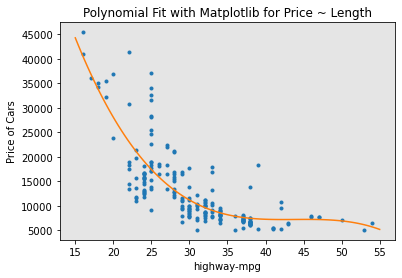

In [90]:
PlotPolly(p, x, y, 'highway-mpg')

In [91]:
np.polyfit(x, y, 3)

array([-1.55663829e+00,  2.04754306e+02, -8.96543312e+03,  1.37923594e+05])

We can already see from plotting that this polynomial model performs better than the linear model. This is because the generated polynomial function "hits" more of the data points.

In [92]:
pr=PolynomialFeatures(degree=2)
Z_pr=pr.fit_transform(Z)

${\textbf{Pipelines:}}$

Data pipelines streamline the data processing procedures. To build a pipeline, we utilize the Pipeline module. We also use StandardScaler as a step in our pipeline.

In [93]:
Input=[('scale',StandardScaler()), ('polynomial', PolynomialFeatures(include_bias=False)), ('model',LinearRegression())]
pipe=Pipeline(Input)

In [94]:
pipe.fit(Z,y)

Pipeline(steps=[('scale', StandardScaler()),
                ('polynomial', PolynomialFeatures(include_bias=False)),
                ('model', LinearRegression())])

In [95]:
ypipe=pipe.predict(Z)
ypipe[0:4]

array([13102.93329646, 13102.93329646, 18226.43450275, 10391.09183955])

When evaluating our models, not only do we want to visualize the results, but we also want a quantitative measure to determine how accurate the model is.

Two very important measures that are often used in Statistics to determine the accuracy of a model are:

* R^2 / R-squared
* Mean Squared Error (MSE)

${\textbf{Mean Squared Error (MSE):}}$
The Mean Squared Error measures the average of the squares of errors, that is, the difference between actual value (y) and the estimated value (ŷ).

Sum of Squared Error : $$  (SSE) = \sum ({y_{i}-\hat{y})^ 2} $$
Total Sum of Squares : $$  (SST) = \sum ({y_{i}-\bar{y})^ 2} $$
Mean Squared Error   : $$  (MSE) =\frac{1}{n} \sum ({y_{i}-\hat{y})^ 2} $$

${\textbf{R-squared:}}$
R squared, also known as the coefficient of determination, is a measure to indicate how close the data is to the fitted regression line.The value of the R-squared is the percentage of variation of the response variable (y) that is explained by a linear model.
$$  (R)^2 = 1- \frac{SSE}{SST} $$
the proportion of explained y-variability Note, negative $(R)^2$ means the model is worse than just predicting the mean. $(R)^2$  is not valid for nonlinear models, as $SS_{residual}+SS_{error} \neq SST $.


${\textbf{Adjusted R-squared:}}$
it changes only when predictors affect R2 above what would be expected by chance
$$  Adj.(R)^2 = 1- (1-R^2)\frac{N-1}{N-p-1} $$



In [96]:
#highway_mpg_fit
lm.fit(X, Y)
# Find the R^2
print('The R-square is: ', lm.score(X, Y))

The R-square is:  0.4965911884339175


We can say that ~ 49.659% of the variation of the price is explained by this simple linear model "horsepower_fit".

In [97]:
Yhat=lm.predict(X)
print('The output of the first four predicted value is: ', Yhat[0:4])

The output of the first four predicted value is:  [16236.50464347 16236.50464347 17058.23802179 13771.3045085 ]


In [98]:
mse = mean_squared_error(Auto['price'], Yhat)
print('The mean square error of price and predicted value is: ', mse)

The mean square error of price and predicted value is:  31635042.944639895


In [99]:
# fit the model 
lm.fit(Z, Auto['price'])
# Find the R^2
print('The R-square is: ', lm.score(Z, Auto['price']))

The R-square is:  0.8093732522175299


We can say that ~ 80.896 % of the variation of price is explained by this multiple linear regression "multi_fit".

In [100]:
Y_predict_multifit = lm.predict(Z)
print('The mean square error of price and predicted value using multifit is: ', \
      mean_squared_error(Auto['price'], Y_predict_multifit))

The mean square error of price and predicted value using multifit is:  11979300.349818882


In [101]:
r_squared = r2_score(y, p(x))
print('The R-square value is: ', r_squared)

The R-square value is:  0.674194666390652


We can say that ~ 67.419 % of the variation of price is explained by this polynomial fit

In [102]:
mean_squared_error(Auto['price'], p(x))

20474146.426361207

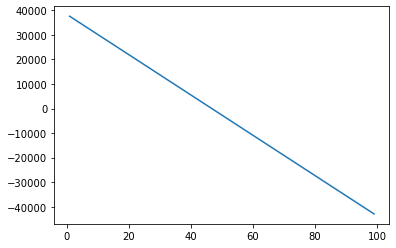

In [103]:
new_input=np.arange(1, 100, 1).reshape(-1, 1)
lm.fit(X, Y)
yhat=lm.predict(new_input)
yhat[0:5]
plt.pyplot.plot(new_input, yhat)
plt.pyplot.show()

Now that we have visualized the different models, and generated the R-squared and MSE values for the fits, how do we determine a good model fit?

${\textbf{What is a good R-squared value?}}$
When comparing models, the model with the higher R-squared value is a better fit for the data.

${\textbf{What is a good MSE?}}$
When comparing models, the model with the smallest MSE value is a better fit for the data.

Simple Linear Regression: Using Highway-mpg as a Predictor Variable of Price.
* R-squared: 0.49659118843391759
* MSE: 3.16 x10^7

Multiple Linear Regression: Using Horsepower, Curb-weight, Engine-size, and Highway-mpg as Predictor Variables of Price.
* R-squared: 0.80896354913783497
* MSE: 1.2 x10^7

Polynomial Fit: Using Highway-mpg as a Predictor Variable of Price.
* R-squared: 0.6741946663906514
* MSE: 2.05 x 10^7

${\textbf{Simple Linear Regression model (SLR) vs Multiple Linear Regression model (MLR)}}$
The more variables you have, the better your model predicts, although this is not always the case. Sometimes there isn't enough data, you run into numerical issues, or many of the variables aren't meaningful and even behave as noise. As a result, the MSE and R2 should be checked at all times.
So, in order to compare the outcomes of the MLR and SLR models, we use a combination of R-squared and MSE to get the best conclusion regarding the model's fit.

* The MSE of SLR is 3.16x10^7 while MLR has an MSE of 1.2 x10^7. The MSE of MLR is much smaller.
* The R-squared in this case, we can also see that there is a big difference between the R-squared of the SLR and the R-squared of the MLR. The R-squared for the SLR (0.497) is very small compared to the R-squared for the MLR (0.809).

This R-squared in combination with the MSE show that MLR seems like the better model fit in this case, compared to SLR.

${\textbf{Simple Linear Model (SLR) vs Polynomial Fit}}$

* MSE: We can see that Polynomial Fit brought down the MSE, since this MSE is smaller than the one from the SLR.
* R-squared: The R-squared for the Polyfit is larger than the R-squared for the SLR, so the Polynomial Fit also brought up the R-squared quite a bit.

Since the Polynomial Fit resulted in a lower MSE and a higher R-squared, we can conclude that this was a better fit model than the simple linear regression for predicting Price with Highway-mpg as a predictor variable.


${\textbf{Simple Linear Model (SLR) vs Polynomial Fit}}$
* MSE: The MSE for the MLR is smaller than the MSE for the Polynomial Fit.
* R-squared: The R-squared for the MLR is also much larger than for the Polynomial Fit.

${\textbf{Conclusion}}$

After comparing these three models, we determine that the MLR model is the best at predicting price from our dataset. This finding makes sense given that we have 27 factors in total and know that more than one of them is a possible predictor of the final automobile price.

In [104]:
categ = ['make','aspiration','num-of-doors','body-style','drive-wheels','engine-location','horsepower-binned','num-of-cylinders','fuel-system']

# Encode Categorical Columns
le = LabelEncoder()
Auto[categ] = Auto[categ].apply(le.fit_transform)
Auto = pd.get_dummies(Auto, drop_first=True)
Auto = Auto.dropna()


In [105]:
X = Auto.drop(['price'], axis=1)
y = Auto[['price']]
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.3, random_state=23)

In [106]:
nr_cv = 5
score_calc = 'neg_mean_squared_error'
def get_best_score(grid):
    
    best_score = np.sqrt(-grid.best_score_)
    print(best_score)    
    print(grid.best_params_)
    print(grid.best_estimator_)
    
    return best_score

${\textbf{Linear Regression}}$

In [107]:
linreg = LinearRegression()
parameters = {'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}
grid_linear = GridSearchCV(linreg, parameters, cv=nr_cv, verbose=1 , scoring = score_calc)
grid_linear.fit(X_train, y_train)
sc_linear = get_best_score(grid_linear)
lr_predict=grid_linear.predict(X_test)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
3264.5862525389457
{'copy_X': True, 'fit_intercept': False, 'normalize': True}
LinearRegression(fit_intercept=False, normalize=True)


In [108]:
print("The R2 score for Ridge is ", r2_score(y_test, lr_predict))
print("The RMSE for Ridge is ", sc_linear)

The R2 score for Ridge is  0.6990382398601801
The RMSE for Ridge is  3264.5862525389457


${\textbf{Ordinary least squares}}$

Ordinary Least Squares regression (OLS) is a common technique for estimating coefficients of linear regression equations which describe the relationship between one or more independent quantitative variables and a dependent variable (simple or multiple linear regression). Least squares stand for the minimum squares error (SSE). Maximum likelihood and Generalized method of moments estimator are alternative approaches to OLS. 

In [109]:
est1 = sm.OLS(y_train, X_train)
est2 = est1.fit()
OLS_predict=est2.predict(X_test)
print(est2.summary())
print("\n")

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.953
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     69.56
Date:                Mon, 10 Oct 2022   Prob (F-statistic):           1.47e-57
Time:                        13:23:10   Log-Likelihood:                -1238.1
No. Observations:                 139   AIC:                             2540.
Df Residuals:                     107   BIC:                             2634.
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
symboling          -354.2338    308.77

In [110]:
print("The R2 score for Ridge is ", r2_score(y_test, OLS_predict))
print("The RMSE for Ridge is ", np.sqrt(mean_squared_error(y_test, OLS_predict)))

The R2 score for Ridge is  0.6990382398595809
The RMSE for Ridge is  3997.050244106288


${\textbf{Ridge}}$

Ridge regression is a model tuning method that is used to analyse any data that suffers from multicollinearity. This method performs L2 regularization. When the issue of multicollinearity occurs, least-squares are unbiased, and variances are large, this results in predicted values being far away from the actual values.
* Ridge regression: First regularization technique. Also it is called L2 regularization.
* Ridge regression lost fuction = OLS + alpha * sum(parameter^2)
* alpha is parameter we need to choose to fit and predict. Picking alpha is similar to picking K in KNN. As you understand alpha is hyperparameter that we need to choose for best accuracy and model complexity. This process is called hyperparameter tuning.
* What if alpha is zero? lost function = OLS so that is linear rigression :)
* If alpha is small that can cause overfitting
* If alpha is big that can cause underfitting. But do not ask what is small and big. These can be change from problem to problem.

In [111]:
ridge = Ridge()
parameters = {'alpha':[0.001,0.005,0.01,0.1,0.5,1], 'normalize':[True,False], 'tol':[1e-06,5e-06,1e-05,5e-05]}
grid_ridge = GridSearchCV(ridge, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_ridge.fit(X_train, y_train)
ridge_predict = grid_ridge.predict(X_test)
sc_ridge = get_best_score(grid_ridge)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
2749.7899586424883
{'alpha': 1, 'normalize': False, 'tol': 1e-06}
Ridge(alpha=1, normalize=False, tol=1e-06)


In [112]:
print("The R2 score for Ridge is ", r2_score(y_test, ridge_predict))
print("The RMSE for Ridge is ", np.sqrt(mean_squared_error(y_test, ridge_predict)))

The R2 score for Ridge is  0.7387088078692474
The RMSE for Ridge is  3724.3143775253757


${\textbf{Lasso}}$

Lasso regression is a type of linear regression that uses shrinkage. Shrinkage is where data values are shrunk towards a central point, like the mean. The lasso procedure encourages simple, sparse models (i.e. models with fewer parameters).

* Lasso regression: Second regularization technique. Also it is called L1 regularization.
* Lasso regression lost fuction = OLS + alpha * sum(absolute_value(parameter))
* It can be used to select important features od the data. Because features whose values are not shrinked to zero, is chosen by lasso regression
* In order to choose feature, I add new features in our regression data

In [113]:
lasso = Lasso()
parameters = {'alpha':[1e-03,0.01,0.1,0.5,0.8,1], 'normalize':[True,False], 'tol':[1e-06,1e-05,5e-05,1e-04,5e-04,1e-03]}
grid_lasso = GridSearchCV(lasso, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_lasso.fit(X_train, y_train)
sc_lasso = get_best_score(grid_lasso)
lasso_predict = grid_lasso.predict(X_test)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
3089.413042897428
{'alpha': 1, 'normalize': True, 'tol': 0.001}
Lasso(alpha=1, normalize=True, tol=0.001)


In [114]:
print("The R2 score for Lasso is ", r2_score(y_test, lasso_predict))
print("The RMSE for Lasso is ", np.sqrt(mean_squared_error(y_test, lasso_predict)))

The R2 score for Lasso is  0.7219727482402294
The RMSE for Lasso is  3841.7370132669616


${\textbf{Elastic Net}}$

Elastic net linear regression uses the penalties from both the lasso and ridge techniques to regularize regression models. The technique combines both the lasso and ridge regression methods by learning from their shortcomings to improve the regularization of statistical models.

In [115]:
enet = ElasticNet()
parameters = {'alpha' :[0.1,1.0,10], 'max_iter' :[1000000], 'l1_ratio':[0.04,0.05], 
              'fit_intercept' : [False,True], 'normalize':[True,False], 'tol':[1e-02,1e-03,1e-04]}
grid_enet = GridSearchCV(enet, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_enet.fit(X_train, y_train)
sc_enet = get_best_score(grid_enet)
enet_predict = grid_enet.predict(X_test)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
2931.350430653759
{'alpha': 0.1, 'fit_intercept': True, 'l1_ratio': 0.05, 'max_iter': 1000000, 'normalize': False, 'tol': 0.001}
ElasticNet(alpha=0.1, l1_ratio=0.05, max_iter=1000000, normalize=False,
           tol=0.001)


In [116]:
print("The Decision Tree score for Lasso is ", r2_score(y_test, enet_predict))
print("The RMSE for Decision Tree is ", np.sqrt(mean_squared_error(y_test, enet_predict)))

The Decision Tree score for Lasso is  0.7905532474846844
The RMSE for Decision Tree is  3334.423545002197


${\textbf{Decision Tree Regressor}}$

Decision tree is one of the well known and powerful supervised machine learning algorithms that can be used for classification and regression problems. The model is based on decision rules extracted from the training data. In regression problem, the model uses the value instead of class and mean squared error is used to for a decision accuracy.

In [117]:
param_grid = { 'max_depth' : [7,8,9,10] ,
               'max_leaf_nodes' : [None, 12,15,18,20] ,'min_samples_split' : [20,25,30],
                 'random_state': [5] }  
grid_dtree = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=nr_cv, refit=True, verbose=1, scoring = score_calc)
grid_dtree.fit(X_train, y_train)
sc_dtree = get_best_score(grid_dtree)
dtr_predict = grid_dtree.predict(X_test)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
2955.2434583782756
{'max_depth': 7, 'max_leaf_nodes': None, 'min_samples_split': 20, 'random_state': 5}
DecisionTreeRegressor(max_depth=7, min_samples_split=20, random_state=5)


In [118]:
print("The Decision Tree score for Lasso is ", r2_score(y_test, dtr_predict))
print("The RMSE for Decision Tree is ", np.sqrt(mean_squared_error(y_test, dtr_predict)))

The Decision Tree score for Lasso is  0.8306547373984983
The RMSE for Decision Tree is  2998.2681707354936


${\textbf{Random Forest Regressor}}$

A random forest is a meta estimator that fits a number of classifying decision trees on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting.

In [119]:
param_grid = {'min_samples_split' : [3,4,6,10], 'n_estimators' : [70,100], 'random_state': [5] }
grid_rf = GridSearchCV(RandomForestRegressor(), param_grid, cv=nr_cv, refit=True, verbose=1, scoring = score_calc)
grid_rf.fit(X_train,y_train)
sc_rf = get_best_score(grid_rf)
dtr_predict = grid_rf.predict(X_test)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
2117.216611873857
{'min_samples_split': 3, 'n_estimators': 70, 'random_state': 5}
RandomForestRegressor(min_samples_split=3, n_estimators=70, random_state=5)


In [120]:
print("The Decision Tree score for Lasso is ", r2_score(y_test, dtr_predict))
print("The RMSE for Decision Tree is ", np.sqrt(mean_squared_error(y_test, dtr_predict)))

The Decision Tree score for Lasso is  0.8848537174568801
The RMSE for Decision Tree is  2472.3440635599013


${\textbf{SGD Regressor}}$

Stochastic Gradient Descent (SGD) regressor basically implements a plain SGD learning routine supporting various loss functions and penalties to fit linear regression models.

In [121]:
sgd = SGDRegressor()
parameters = {'max_iter' :[10000], 'alpha':[1e-05], 'epsilon':[1e-02], 'fit_intercept' : [True]  }
grid_sgd = GridSearchCV(sgd, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_sgd.fit(X_train, y_train)
sc_sgd = get_best_score(grid_sgd)
sgd_predict = grid_sgd.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
2.183300034207329e+16
{'alpha': 1e-05, 'epsilon': 0.01, 'fit_intercept': True, 'max_iter': 10000}
SGDRegressor(alpha=1e-05, epsilon=0.01, max_iter=10000)


In [122]:
print("The Decision Tree score for Lasso is ", r2_score(y_test, sgd_predict))
print("The RMSE for Decision Tree is ", np.sqrt(mean_squared_error(y_test, sgd_predict)))

The Decision Tree score for Lasso is  -2.6903854053226966e+24
The RMSE for Decision Tree is  1.195064092667431e+16


${\textbf{KNN Regressor}}$

KNN regression is a non-parametric method that, in an intuitive manner, approximates the association between independent variables and the continuous outcome by averaging the observations in the same neighbourhood.

In [123]:
param_grid = {'n_neighbors' : [3,4,5,6,7,10,15] ,    
              'weights' : ['uniform','distance'] ,
              'algorithm' : ['ball_tree', 'kd_tree', 'brute']}

grid_knn = GridSearchCV(KNeighborsRegressor(), param_grid, cv=nr_cv, refit=True, verbose=1, scoring = score_calc)
grid_knn.fit(X_train, y_train)
sc_knn = get_best_score(grid_knn)
knn_predict = grid_knn.predict(X_test)

Fitting 5 folds for each of 42 candidates, totalling 210 fits
2824.9613071097006
{'algorithm': 'ball_tree', 'n_neighbors': 3, 'weights': 'distance'}
KNeighborsRegressor(algorithm='ball_tree', n_neighbors=3, weights='distance')


In [124]:
print("The Decision Tree score for Lasso is ", r2_score(y_test, knn_predict))
print("The RMSE for Decision Tree is ", np.sqrt(mean_squared_error(y_test, knn_predict)))

The Decision Tree score for Lasso is  0.8579371617191945
The RMSE for Decision Tree is  2746.149598443047


${\textbf{GaussianProcessRegressor}}$

Gaussian Process Regression (GPR) The GaussianProcessRegressor implements Gaussian processes (GP) for regression purposes. For this, the prior of the GP needs to be specified. The prior mean is assumed to be constant and zero (for normalize_y=False ) or the training data's mean (for normalize_y=True ).

In [125]:
gpr = GaussianProcessRegressor(random_state=5, alpha=5e-9, 
                                n_restarts_optimizer=0, 
                               optimizer='fmin_l_bfgs_b', 
                               copy_X_train=True)
param_grid = {'normalize_y' : [True,False],
              'kernel' : [DotProduct(), ConstantKernel(1.0, (1e-3, 1e3))] }
grid_gpr = GridSearchCV(gpr, param_grid, cv=nr_cv, verbose=1, scoring = score_calc)
grid_gpr.fit(X_train, y_train)
sc_gpr = get_best_score(grid_gpr)
sc_predict = grid_gpr.predict(X_test)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
8269.268210822102
{'kernel': 1**2, 'normalize_y': False}
GaussianProcessRegressor(alpha=5e-09, kernel=1**2, random_state=5)


In [126]:
print("The Decision Tree score for Lasso is ", r2_score(y_test, sc_predict))
print("The RMSE for Decision Tree is ", np.sqrt(mean_squared_error(y_test, sc_predict)))

The Decision Tree score for Lasso is  -0.011234645387858011
The RMSE for Decision Tree is  7326.725463776322


${\textbf{XGBoost}}$

XGBoost is an efficient implementation of gradient boosting that can be used for regression predictive modeling. How to evaluate an XGBoost regression model using the best practice technique of repeated k-fold cross-validation. How to fit a final model and use it to make a prediction on new data.

In [127]:
def objective(trial):
    # Split the train data for each trial.
    X = Auto.drop(['price'], axis=1)
    y = Auto[['price']]
    X_train, X_valid, y_train, y_valid=train_test_split(X, y, test_size=0.3, random_state=23)

    param_grid = {
        'max_depth': trial.suggest_int('max_depth', 1, 8), # Extremely prone to overfitting!
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000, 100), # Extremely prone to overfitting!
        'eta': trial.suggest_float('eta', 0.007, 0.013), # Most important parameter.
        'subsample': trial.suggest_discrete_uniform('subsample', 0.2, 0.9, 0.1),
        'colsample_bytree': trial.suggest_discrete_uniform('colsample_bytree', 0.2, 0.9, 0.1),
        'colsample_bylevel': trial.suggest_discrete_uniform('colsample_bylevel', 0.2, 0.9, 0.1),
        'min_child_weight': trial.suggest_loguniform('min_child_weight', 1e-4, 1e4), # I've had trouble with LB score until tuning this.
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-4, 1e4), # L2 regularization
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-4, 1e4), # L1 regularization
        'gamma': trial.suggest_loguniform('gamma', 1e-4, 1e4),
    } 
    
    reg = xgb.XGBModel(
        # These parameters should help with trial speed.
        objective='reg:squarederror',
        tree_method='gpu_hist',
        predictor='gpu_predictor',
        booster= 'gbtree',

        n_jobs=-1,
        **param_grid
    )
    
    reg.fit(X_train, y_train,
            eval_set=[(X_valid, y_valid)], eval_metric='rmse',
            verbose=False)

    # Returns the best RMSE for the trial.
    # Readers may want to try returning a cross validation score here.
    return np.sqrt(mean_squared_error(y_valid, reg.predict(X_valid)))
    # return my_rmse(y_valid, reg.predict(X_valid))

In [128]:
# train_time = 1 * 60 * 60
train_time = 1 * 30 * 30
study = optuna.create_study(direction='minimize', sampler=TPESampler(), study_name='XGBRegressor')
study.optimize(objective, timeout=train_time)

print('Number of finished trials: ', len(study.trials))
print('Best trial:')
trial = study.best_trial

print('\tValue: {}'.format(trial.value))
print('\tParams: ')
for key, value in trial.params.items():
    print('\t\t{}: {}'.format(key, value))

[I 2022-10-10 13:23:28,196] A new study created in memory with name: XGBRegressor
[I 2022-10-10 13:23:29,733] Trial 0 finished with value: 15589.66618575694 and parameters: {'max_depth': 7, 'n_estimators': 800, 'eta': 0.007324656017430798, 'subsample': 0.2, 'colsample_bytree': 0.8, 'colsample_bylevel': 0.6000000000000001, 'min_child_weight': 7523.519849112455, 'reg_lambda': 0.0005346109133872645, 'reg_alpha': 0.14701088868374446, 'gamma': 685.7270795465245}. Best is trial 0 with value: 15589.66618575694.
[I 2022-10-10 13:23:30,628] Trial 1 finished with value: 15589.66618575694 and parameters: {'max_depth': 2, 'n_estimators': 900, 'eta': 0.007806427216955477, 'subsample': 0.7, 'colsample_bytree': 0.30000000000000004, 'colsample_bylevel': 0.2, 'min_child_weight': 1180.9291575371478, 'reg_lambda': 1406.099180469111, 'reg_alpha': 0.5070558353342122, 'gamma': 0.023654879005600593}. Best is trial 0 with value: 15589.66618575694.
[I 2022-10-10 13:23:31,451] Trial 2 finished with value: 2494.

Number of finished trials:  351
Best trial:
	Value: 2086.884869464162
	Params: 
		max_depth: 8
		n_estimators: 500
		eta: 0.012259298913321205
		subsample: 0.4
		colsample_bytree: 0.8
		colsample_bylevel: 0.2
		min_child_weight: 0.40608386164578925
		reg_lambda: 0.00010075921549648566
		reg_alpha: 14.803535085282935
		gamma: 0.007140094590901593


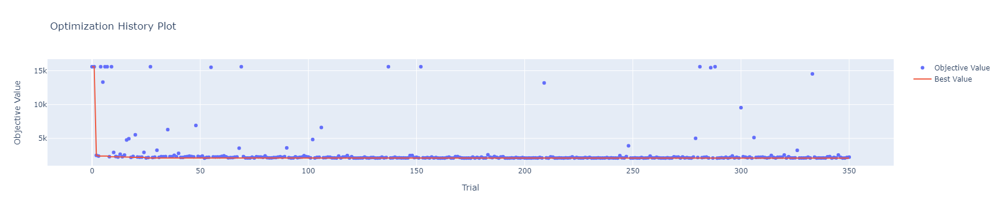

In [132]:
optuna.visualization.plot_optimization_history(study)

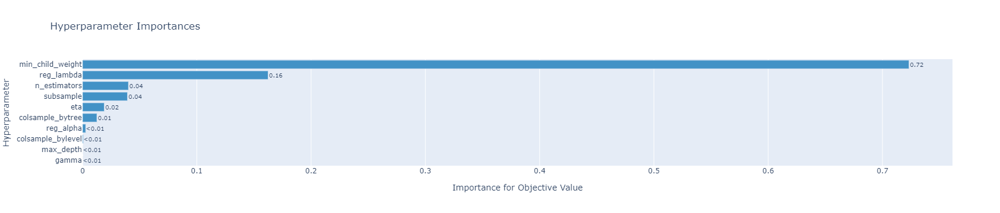

In [133]:
optuna.visualization.plot_param_importances(study)

In [140]:
def run_xgb(train_X, train_y, val_X, val_y):
    BestParams={
        'objective': 'reg:squarederror', 
        'eval_metric': 'rmse',
        "booster" :"gbtree",
        'tree_method': 'gpu_hist',
        'max_depth': 8,
		'eta': 0.012259298913321205,
		'subsample': 0.4,
		'colsample_bytree': 0.8,
		'colsample_bylevel': 0.2,
		'min_child_weight': 0.40608386164578925,
		'reg_lambda': 0.00010075921549648566,
		'reg_alpha': 14.803535085282935,
		'gamma': 0.007140094590901593,
        'random_state': 42
    }
    progress = dict()
    tr_data = xgb.DMatrix(train_X, train_y)
    va_data = xgb.DMatrix(val_X, val_y)
    
    watchlist = [(tr_data, 'train'), (va_data, 'valid')]
    
    model_xgb = xgb.train(BestParams, tr_data, 500, watchlist, maximize=False, early_stopping_rounds = 100, verbose_eval=100,evals_result=progress)
    
    dtest = xgb.DMatrix(val_X)
    xgb_pred_y = model_xgb.predict(dtest, ntree_limit=model_xgb.best_ntree_limit)
    
    return xgb_pred_y, model_xgb,progress

In [141]:
# Training XGB
pred_test_xgb, model_xgb,progress = run_xgb(X_train, y_train, X_test, y_test)
print("XGB Training Completed...")

[0]	train-rmse:15205.48764	valid-rmse:15389.66458
[100]	train-rmse:4696.20318	valid-rmse:4874.84031
[200]	train-rmse:1674.41012	valid-rmse:2455.30952
[300]	train-rmse:819.45720	valid-rmse:2139.05039
[400]	train-rmse:582.61518	valid-rmse:2148.95468
[427]	train-rmse:550.78436	valid-rmse:2139.35190
XGB Training Completed...


In [143]:
print("The Decision Tree score for Lasso is ", r2_score(y_test, pred_test_xgb))
print("The RMSE for Decision Tree is ", np.sqrt(mean_squared_error(y_test, pred_test_xgb)))

The Decision Tree score for Lasso is  0.9143982202922771
The RMSE for Decision Tree is  2131.6963689179584


<center>${\textbf{Conclusion}}$<center>
    
Comparing these three models, we conclude that the XGost model is the best model to be able to predict price from our dataset. This result makes sense, since we have many variables , and we know that more than one of those variables are potential predictors of the final car price.